# **Lab 2 - Debugging Deep Learning Networks**


**Goal**: Learn a skill of debugging deep learning networks on your own.


**Lab workflow**:
- Go to **[Piazza post @154](https://piazza.com/class/mjnqcfnm4ci4v1/post/154)**, download the notebook and data. You can save it on your local machine. We use a toy data (just 4 files from HW1P2).
- Follow the instruction in this notebook and complete **12 checkpoints**.
- By the end of the Lab, respond in **[Piazza post @154](https://piazza.com/class/mjnqcfnm4ci4v1/post/154)** how many checkpoints you completed. It's not graded and designed to help you with your HWs.

**Prepared by**:
- Thomas Seleshi, IDL TA S26, tseleshi@andrew.cmu.edu
- Praneeth Chaitanya, IDL TA S26, pjonnavi@andrew.cmu.edu

**Extra resources**: This Lab builds upon “Recitation 0.19: Debugging”.



---



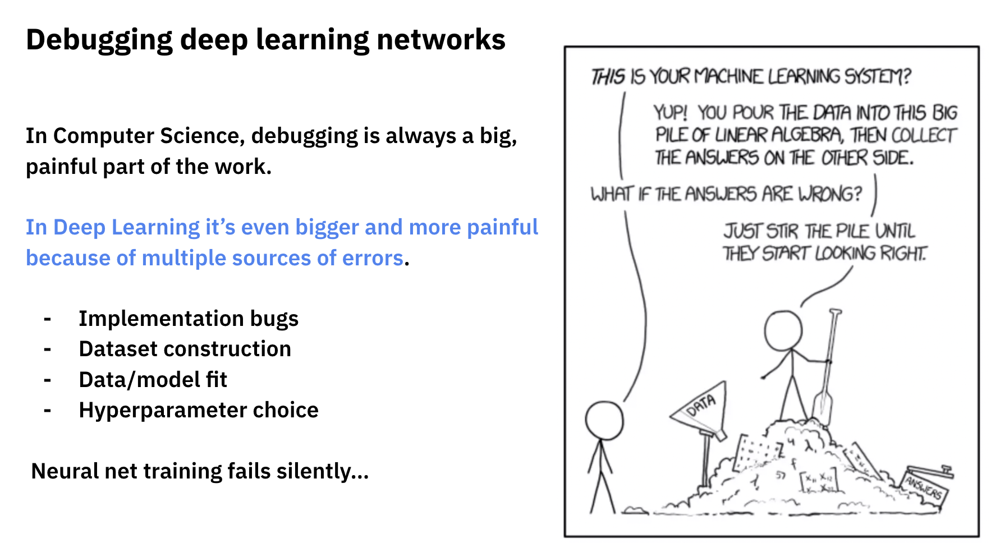



---



**Plan**:
1. **How to debug HW Parts 1**
   - Topic 1
   - Topic 2  
   - Topic 3
2. **How to debug HW Parts 2**  
   - Data loading and preprocessing
   - Building a model
   - Training and monitoring
   - Testing and Kaggle submission


In [ ]:
import numpy as np

## **1. How to debug HW Parts 1**

#### **The structure of a P1**

```

p1_Handout/  
|
├── models/
│   ├─ The actual model implementations: CNN, RNN, MLP etc
|
├── mytorch/  
│   ├── nn/   
│   │   ├── Activations, Losses, and various layers: Linear, Convolutional etc
|   |   |
│   └── optim/   
│       ├── Optimizers like SGD, Adam and more.
|
├── autograder_flags.py  
├── autograder.py  
└── requirements.txt




```


If you see
```
Error: No module named mytorch
```

Make sure you are in the correct directory while executing the local tests

#### **Autograder**

The autograder is a mechanism for testing your own code. The tests to be conducted are defined in `autograder_flags.py`.

In [ ]:
DEBUG_AND_GRADE_LINEAR_flag = True
DEBUG_AND_GRADE_SIGMOID_flag = True
DEBUG_AND_GRADE_BATCHNORM_flag = False

Autograder fundamentally has two types of tests.

In [ ]:
!pip install ipdb

In [ ]:
import ipdb

##### **1. Closeness test**
Purpose: Verify that your outputs are numerically close to the expected results.

**CHECKPOINT #1:** Fix the error.



In [ ]:
#TODO: Fix the Error
Z = np.array([2.001, 3.999])
Z_solution = np.array([2.0, 4.0])

In [ ]:
TEST_closeness = np.allclose(Z, Z_solution, atol=1e-4) #atol is tolerance
print("Closeness Test:", "PASS" if TEST_closeness else "FAIL")

##### **2. Architectural test**
Purpose: Verify that your network has the appropriate structure.

**CHECKPOINT #2:** Fix the error.



In [ ]:
W = np.random.normal(size = (3,3))

In [ ]:
#TODO: Fix the Error
TEST_W = np.random.normal((3,2))
print("Architecture Test:", "PASS" if W.shape == TEST_W.shape else "FAIL")

#### **Fixing a buggy Linear Layer**




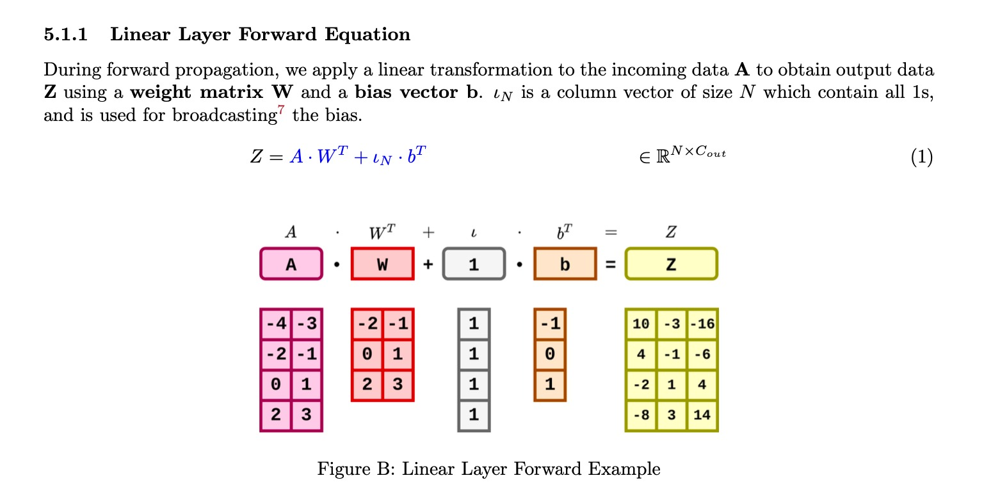

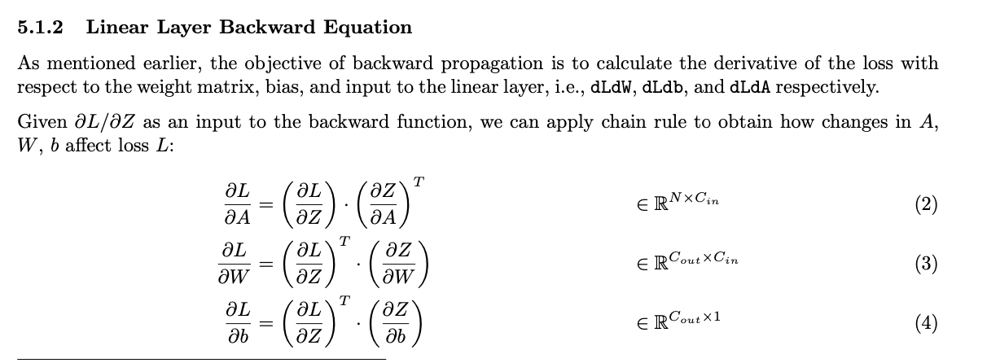



In [ ]:
#TODO: Fix the Linear class.

class Linear:

    def __init__(self, in_features, out_features, debug=False):
        """
        Initialize the weights and biases with zeros
        Checkout np.zeros function.
        Read the writeup to identify the right shapes for all.
        """
        self.W = np.zeros((out_features, in_features))
        self.b = np.zeros((out_features, 1))

        self.debug = debug

    def forward(self, A):
        """
        :param A: Input to the linear layer with shape (N, C0)
        :return: Output Z of linear layer with shape (N, C1)
        Read the writeup for implementation details
        """

        self.A = A
        self.N = self.A.shape[0]
        self.Ones = np.ones((self.N,1))
        Z = self.A * self.W.T + self.Ones @ self.b.T

        return Z

    def backward(self, dLdZ):

        dLdA = dLdZ @ self.W
        self.dLdW = dLdZ.T * self.A
        self.dLdb = dLdZ.T * self.Ones

        if self.debug:

            self.dLdA = dLdA

        return dLdA


In [ ]:
#TODO: Fix the ReLU class.

class ReLU:
    """
    On same lines as above:
    Define 'forward' function
    Define 'backward' function
    Read the writeup for further details on ReLU.
    """

    def forward(self, Z):
        self.A = np.minimum(0, Z)
        return self.A

    def backward(self, dLdA):
        return dLdA * np.where(self.A == 0, 1, 0)

##### **Forward pass tests**

**CHECKPOINT #3:** Fix the error.


In [ ]:
A_input = np.array([[1.0, -2.0], [3.0, 4.0]])
W = np.array([[1.0, -1.0], [0.5, 0.5]])
b = np.array([[1.0], [0.0]])

linear = Linear(2, 2)
relu = ReLU()

linear.W = W
linear.b = b

Z_linear = linear.forward(A_input)
A_relu = relu.forward(Z_linear)

Z_linear_solution = A_input @ W.T + b.T
A_relu_solution = np.maximum(0, Z_linear_solution)

TEST_forward_linear = np.allclose(Z_linear, Z_linear_solution, atol=1e-4)
TEST_forward_relu = np.allclose(A_relu, A_relu_solution, atol=1e-4)

TEST_forward_combined = TEST_forward_linear and TEST_forward_relu

print("Forward Pass Test:", "PASS" if TEST_forward_combined else "FAIL")
print("")
print("Forward Pass Test (Linear):", "PASS" if TEST_forward_linear else "FAIL")
print("Forward Pass Test (ReLU):", "PASS" if TEST_forward_relu else "FAIL")

##### **Backward pass tests**

**CHECKPOINT #4:** Fix the error.



In [ ]:
dLdA_relu = np.array([[1.0, -0.5], [0.0, 0.5]])

dLdZ_relu = relu.backward(dLdA_relu)
linear.backward(dLdZ_relu)

dLdZ_relu_solution = dLdA_relu * (Z_linear > 0)
dLdW_linear_solution = dLdZ_relu_solution.T @ A_input
print(dLdW_linear_solution)
# Backward tests

TEST_backward_linear = np.allclose(linear.dLdW, dLdW_linear_solution, atol=1e-4)
TEST_backward_relu = np.allclose(dLdZ_relu, dLdZ_relu_solution, atol=1e-4)
TEST_back_combined = TEST_backward_linear and TEST_backward_relu

print("Backward Pass Test:", "PASS" if TEST_back_combined else "FAIL")
print("")
print("Backward Pass Test (Linear):", "PASS" if TEST_backward_linear else "FAIL")
print("Backward Pass Test (ReLU):", "PASS" if TEST_backward_relu else "FAIL")

#### **How to approach a P1 to avoid errors**

1. **Work through shapes manually before coding**: Understanding the expected dimensions of inputs, weights, and outputs can prevent many bugs.

2. **Use print statements**: Debugging shapes with print statements can help identify where mismatches occur.

3. **Invest time in reading the writeup**: Spending an extra 20 minutes carefully reviewing the writeup can save hours of debugging later.

4. **Leverage VS Code's debugger**: Refer to Recitation 0.12 on the [course website](https://deeplearning.cs.cmu.edu/S25/index.html) to learn how to use a debugger effectively.

## **2. How to debug HW Parts 2**

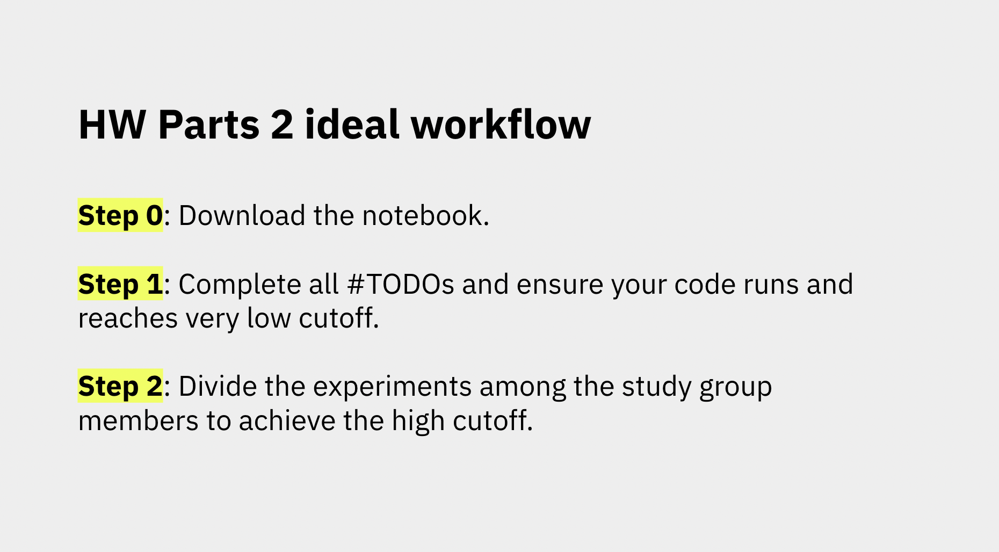



---



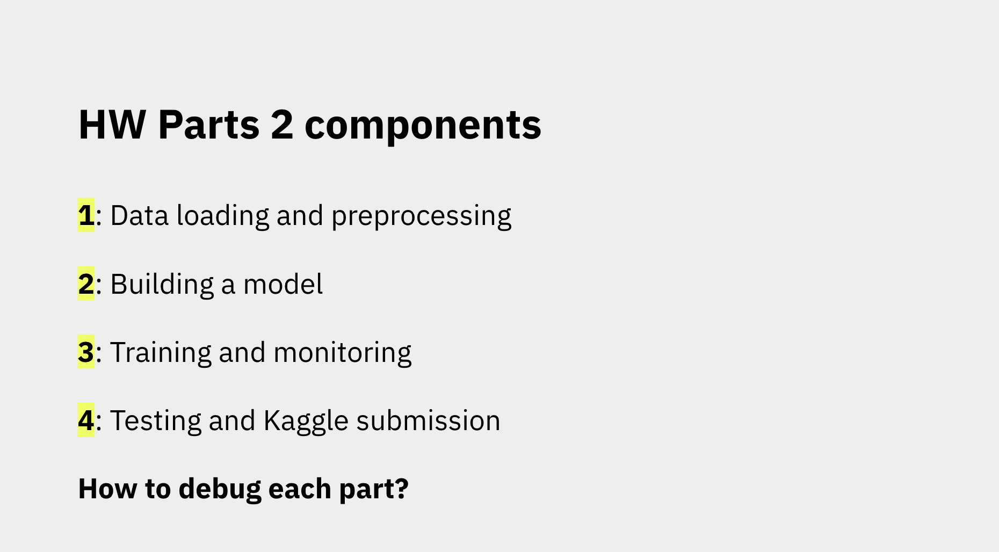

### **2.1 Data loading and preprocessing**

#### **2.1.0 Installs**

In [ ]:
!pip install matplotlib --quiet
!pip install torchinfo --quiet


In [ ]:
import torch
import numpy as np
from torchinfo import summary
import matplotlib.pyplot as plt
import math
import os
np.set_printoptions(threshold=100)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device: ", device)

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device: ", device)
np.set_printoptions(threshold=100)

In [ ]:
## Uncomment if you're using colab

# from google.colab import drive
# drive.mount('/content/drive')

#### **2.1.1 Centralization of hyperparameters**


**First tip**: We don't recommend hardcoding the values, but rather storing them in a config dictionary/yaml files. See below.

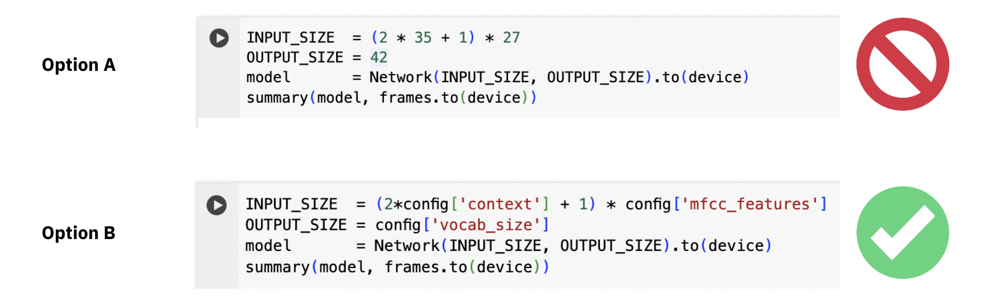



---



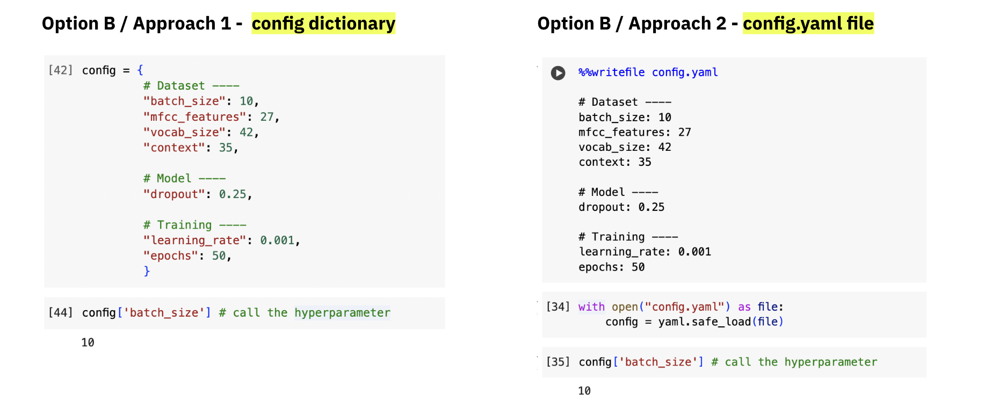



---



In [ ]:
# TODO: RUN THE CELL TO INITIALIZE CONFIGS

## Creating a config dictionary
config = {
         # Dataset ----
         "batch_size": 10,
         "mfcc_features": 27,
         "vocab_size": 42,
         "context": 35,

         # Model ----
         "dropout": 0.25,

         # Training ----
         "learning_rate": 0.001,
         "epochs": 50,}

## Calling specific config when you need them
config['batch_size']

#### **2.1.2 Reviewing a single mfcc and transcript file from the dataset**


In [ ]:
# TODO: SPECIFY THE DIRECTORY WHERE YOU DATA FOLDER IS STORED
# The easiest way is to save the files on the drive and link the folder
data_dir = "..."
print(os.listdir(data_dir))
## In the output you should see 4 files: 'train-mfcc-103-1240-0000.npy', 'train-transcript-103-1240-0000.npy', 'train-mfcc-103-1240-0001.npy', 'train-transcript-103-1240-0001.npy'

In [ ]:
# TODO: RUN THE CELL TO PLOT A SINGLE MFCC AND TRANSCRIPT

def plot_mfcc(mfcc, title="Single MFCC File"):
    plt.figure(figsize=(10, 4))
    plt.imshow(mfcc.T, cmap='viridis', aspect='auto')
    #plt.title(title)
    plt.xlabel("Time Steps")
    plt.ylabel("Features")
    plt.colorbar(format='%+2.0f dB')
    plt.show()

# Load one MFCC file and one transcript file
mfcc_file = os.path.join(data_dir, 'train-mfcc-103-1240-0001.npy')
transcript_file = os.path.join(data_dir, 'train-transcript-103-1240-0001.npy')
mfcc = np.load(mfcc_file)
transcript = np.load(transcript_file)

# Visualize MFCC
print("Single MFCC file:")
plot_mfcc(mfcc)

# Print transcript
print("Single transcript file:\n")
print(transcript[:6],  transcript[7:])

**CHECKPOINT #5**: What's in our data? What are the inputs (x) and targets (y)? What are their shapes? What could we possibly do with our data to achieve great modeling results?

--- [Your answer] ---

#### **2.1.3 Converting mfcc -> frames and transcripts -> phonemes**

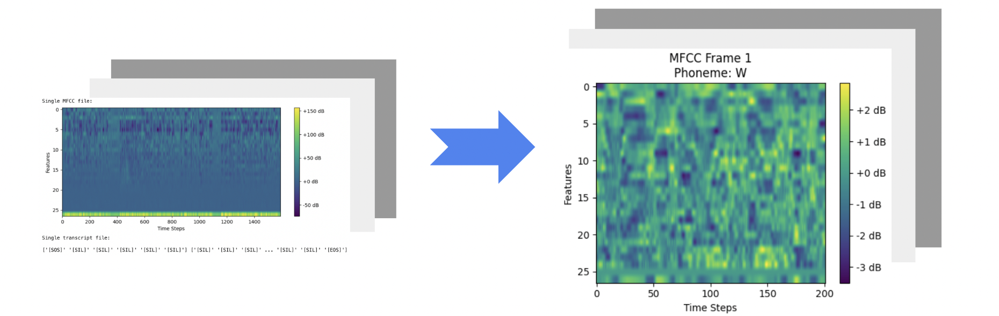



---



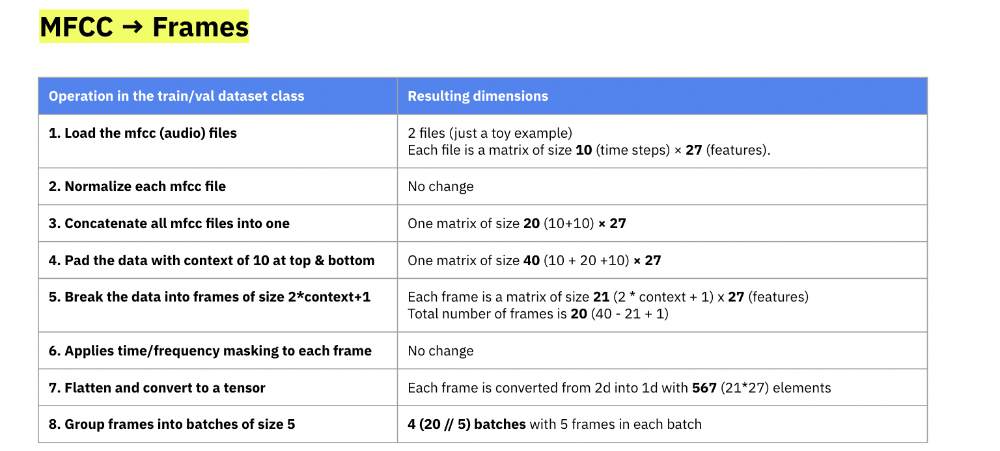

In [ ]:
def process_mfcc(context, mfcc_features, batch_size, data_type='toy', normalization = False):

    # 1: Load two MFCC files
    if data_type == 'toy':
        mfcc1 = np.random.rand(10, mfcc_features)
        mfcc2 = np.random.rand(10, mfcc_features)
    elif data_type == 'real':
        mfcc_file1 = os.path.join(data_dir, 'train-mfcc-103-1240-0000.npy')
        mfcc_file2 = os.path.join(data_dir, 'train-mfcc-103-1240-0001.npy')
        mfcc1 = np.load(mfcc_file1)
        mfcc2 = np.load(mfcc_file2)
    print('Individual MFCC shape:', mfcc1.shape)

    # 2: Normalize each MFCC file
    if normalization:
      mfcc1 = (mfcc1 - np.mean(mfcc1, axis=0)) / (np.std(mfcc1, axis=0) + 1e-5)
      mfcc2 = (mfcc2 - np.mean(mfcc2, axis=0)) / (np.std(mfcc2, axis=0) + 1e-5)

    # 3: Concatenate all MFCC files
    combined_mfcc = np.concatenate([mfcc1, mfcc2], axis=0)
    print('Concatenated MFCC shape:', combined_mfcc.shape)

    # 4: Pad the concatenated file with context
    padded_mfcc = np.pad(combined_mfcc, ((context, context), (0, 0)), mode='constant', constant_values=0)
    print('Padded MFCC shape:', padded_mfcc.shape)

    # 5: Extract frames with the given context
    total_timesteps = padded_mfcc.shape[0]
    frame_size = 2 * context + 1  # Including the context
    num_frames = total_timesteps - frame_size + 1  # Number of possible frames
    print('Number of possible frames (splits of MFCC):', num_frames)

    frames = np.array([padded_mfcc[i:i + frame_size].flatten() for i in range(num_frames)])
    print('Frames shape:', frames.shape)

    # 7-8: Group frames into batches
    num_batches = math.ceil(num_frames / batch_size)
    batches_frames = [frames[i * batch_size:(i + 1) * batch_size] for i in range(num_batches)]
    print('Number of batches (groups of frames):', len(batches_frames))
    print('Single batch of frames shape:', batches_frames[0].shape)

    return batches_frames

# Example usage
config = {'context': 0, 'mfcc_features': 27, 'batch_size': 5}
batches_frames = process_mfcc(config['context'], config['mfcc_features'], config['batch_size'], data_type='toy')

**CHECKPOINT #6**: What's the difference between the calculation of dimensions above and real HW1P2?

--- [Your answer] ---



---



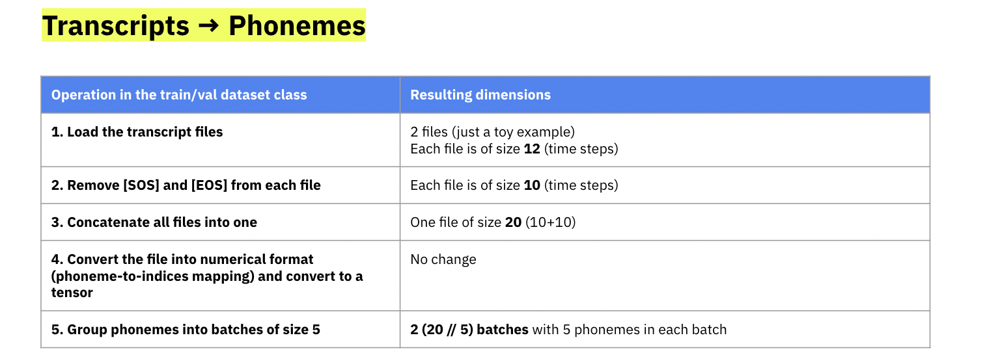

In [ ]:
# TODO: JUST RUN THE CELL, FEEL FREE TO EXPERIMENT WITH PARAMETERS

def process_transcripts(batch_size, data_type='toy'):

    # 1: Load two transcript files
    if data_type == 'toy':
        transcript1 = ['SOS', 'AH', 'B', 'K', 'AH', 'K', 'K', 'AH', 'B', 'B', 'B', 'B', 'EOS']
        transcript2 = ['SOS', 'D', 'EY', 'F', 'G', 'HH', 'EY', 'F', 'G', 'F', 'G', 'EOS']
    elif data_type == 'real':
        transcript_file1 = os.path.join(data_dir, 'train-transcript-103-1240-0000.npy')
        transcript_file2 = os.path.join(data_dir, 'train-transcript-103-1240-0001.npy')
        transcript1 = np.load(transcript_file1)
        transcript2 = np.load(transcript_file2)

    print('Individual transcript phonemes', transcript1)
    print('Individual transcript length', len(transcript1))

    # 2: Remove [SOS] and [EOS]
    transcript1 = transcript1[1:-1]
    transcript2 = transcript2[1:-1]
    print('Individual transcript without [SOS] and [EOS]', transcript1)
    print('Individual transcript without [SOS] and [EOS] length', len(transcript1))

    # 3: Concatenate transcripts
    combined_transcripts = np.concatenate([transcript1, transcript2], axis=0)
    print('Concatenated transcripts length', len(combined_transcripts))

    # 4: Map phonemes to indices
    phonemes = ['[SIL]', 'AA', 'AE', 'AH', 'AO', 'AW', 'AY', 'B', 'CH', 'D', 'DH', 'EH', 'ER', 'EY',
                    'F', 'G', 'HH', 'IH', 'IY', 'JH', 'K', 'L', 'M', 'N', 'NG', 'OW', 'OY', 'P', 'R',
                    'S', 'SH', 'T', 'TH', 'UH', 'UW', 'V', 'W', 'Y', 'Z', 'ZH', '[SOS]', '[EOS]']
    phoneme_to_index = {phoneme: i for i, phoneme in enumerate(phonemes)}
    def process_transcript(transcript):
        return [phoneme_to_index[phoneme] for phoneme in transcript]

    combined_transcripts_indices = process_transcript(combined_transcripts)
    print('Phoneme-to-index mapping', phoneme_to_index)
    print('Combined transcript indices', combined_transcripts_indices)

    # 5: Group the phonemes into batches
    num_batches_phonemes = math.ceil(len(combined_transcripts) / batch_size)
    print("Number of batches (groups of phonemes)", num_batches_phonemes)
    batches_phonemes = [
        combined_transcripts_indices[i * batch_size:(i + 1) * batch_size]
        for i in range(num_batches_phonemes)]
    #print("Batches of phonemes")
    #for i, batch in enumerate(batches_phonemes):
        #print(f"Batch {i + 1}: {batch}")

    return batches_phonemes

# Example usage
batch_size = 5
batches_phonemes = process_transcripts(batch_size, data_type='toy')

**CHECKPOINT #7**: Why do we need to do phoneme-to-indices mapping in step #4 above?

--- [Your answer] ---

#### **2.1.4 Adding context**

In [ ]:
config['normalization'] = False # TODO: TRY WITH AND WITHOUT NORMALIZATION
config['context'] = 0 # TODO: TRY DIFFERENT CONTEXT, FOR EXAMPLE, 0, 5, 20. WHAT CHANGES?
config['batch_size'] = 5
config['data_type'] = 'real'
chosen_frame_idx = 0 # TODO: TRY DIFFERENT FRAME IDX. HOW 0 IS DIFFERENT FROM 50

batches_frames = process_mfcc(context = config['context'], data_type=config['data_type'], mfcc_features = config["mfcc_features"], batch_size = config['batch_size'], normalization = config['normalization'])
batches_phonemes = process_transcripts(data_type=config['data_type'], batch_size = config['batch_size'])

# Determine the batch and the position within the batch
batch_num = chosen_frame_idx // config["batch_size"]
within_batch_idx = chosen_frame_idx % config["batch_size"]

# Extract the chosen frame and corresponding phoneme
chosen_frame = batches_frames[batch_num][within_batch_idx]  # Extract the frame from the specified batch
corresponding_phoneme_index = batches_phonemes[batch_num][within_batch_idx]  # Extract the phoneme index
phonemes = ['[SIL]', 'AA', 'AE', 'AH', 'AO', 'AW', 'AY', 'B', 'CH', 'D', 'DH', 'EH', 'ER', 'EY', 'F', 'G', 'HH', 'IH', 'IY', 'JH', 'K', 'L', 'M', 'N', 'NG', 'OW', 'OY', 'P', 'R', 'S', 'SH', 'T', 'TH', 'UH', 'UW', 'V', 'W', 'Y', 'Z', 'ZH', '[SOS]', '[EOS]']
index_to_phoneme = {i: phoneme for i, phoneme in enumerate(phonemes)} # Convert indices back to phonemes
corresponding_phoneme = index_to_phoneme[corresponding_phoneme_index]  # Get the actual phoneme

# Visualization
plt.figure(figsize=(5, 4))
plt.imshow(chosen_frame.reshape(-1, config["mfcc_features"]).T, aspect='auto', cmap='viridis')
plt.title(f'Phoneme: {corresponding_phoneme} (Context={config["context"]})')
plt.xlabel('Time (context frames)')
plt.ylabel('MFCC Coefficients')
plt.colorbar(label='Value')
plt.tight_layout()
plt.show()

**CHECKPOINT #8**:

(1) Is normalizing the data helpful? Can you tell from the chart if data is normalized?

--- [Your answer] ---

(2) Is adding context useful? Can you tell from the chart if the context being added?

--- [Your answer] ---

#### **2.1.5 Making it more efficient - using a Pytorch dataset class**

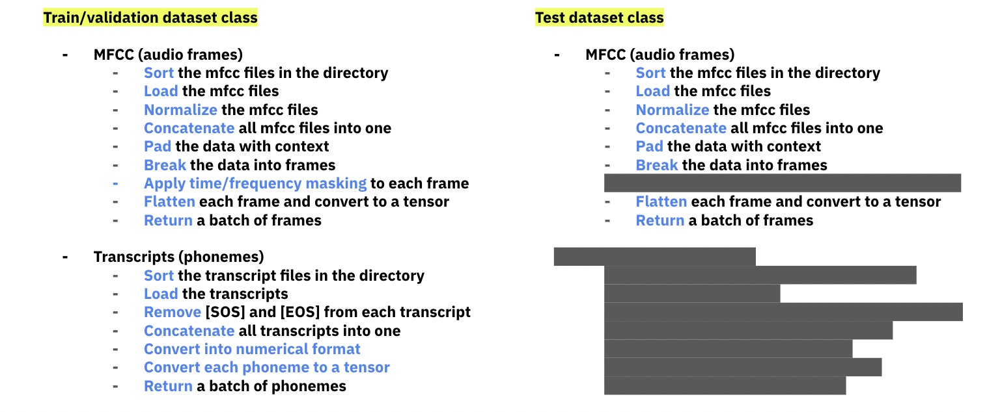

**CHECKPOINT #9**: What’s the difference between train and test dataset classes? Why do we need to separate class instances?


--- [Your answer] ---



---



#### **2.1.6 Specifying a batch size**

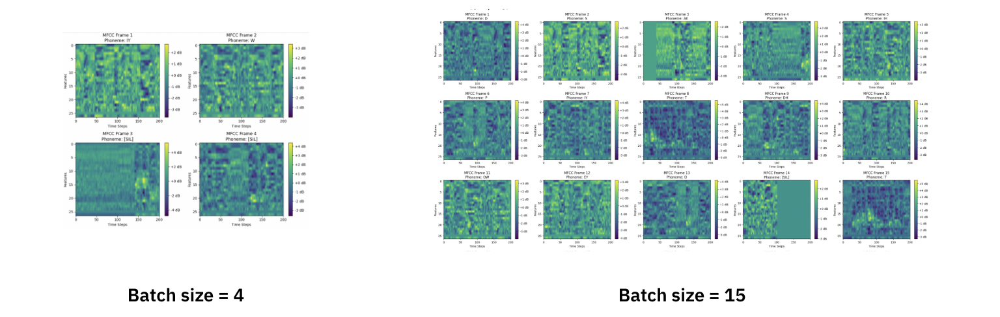

**CHECKPOINT #10**: What's the difference between a batch size of 4 and 15, and how does batch size affect RAM memory usage?



--- [Your answer] ---

#### **2.1.7 Applying data transformations (time and frequency masking)**

In [ ]:
# OPTIONAL. FEEL FREE TO WRITE A CODE AND INCORPORATE INTO THE PLOTS ABOVE

### **2.2 Building a model**

In [ ]:
# TO DO: JUST RUN IT

class Network(torch.nn.Module):

    def __init__(self, input_size, output_size):

        super(Network, self).__init__()
        self.model = torch.nn.Sequential(

            # layer 1
            torch.nn.Linear(input_size, 200),
            torch.nn.BatchNorm1d(200),
            torch.nn.ReLU(),

            # layer 2
            torch.nn.Linear(200, 400),
            torch.nn.BatchNorm1d(400), # TO DO: TRY PASSING HERE 200 INSTEAD OF 400. WHY ERROR?
            torch.nn.ReLU(),

            # output layer
            torch.nn.Linear(400, output_size)) # TO DO: TRY PASSING HERE 200 INSTEAD OF 400. WHY ERROR?

    def forward(self, x):
        out = self.model(x)
        return out

config = {'context': 10, 'mfcc_features': 27, 'vocab_size': 50}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

INPUT_SIZE = (2 * config['context'] + 1) * config['mfcc_features']
OUTPUT_SIZE = config['vocab_size']
model = Network(INPUT_SIZE, OUTPUT_SIZE).to(device)
summary(model, input_size=(INPUT_SIZE,))

**CHECKPOINT #11**: How many parameters does this model have? Which layer is the most computationally intense?



--- [Your answer] ---

### **2.3 Training and monitoring**

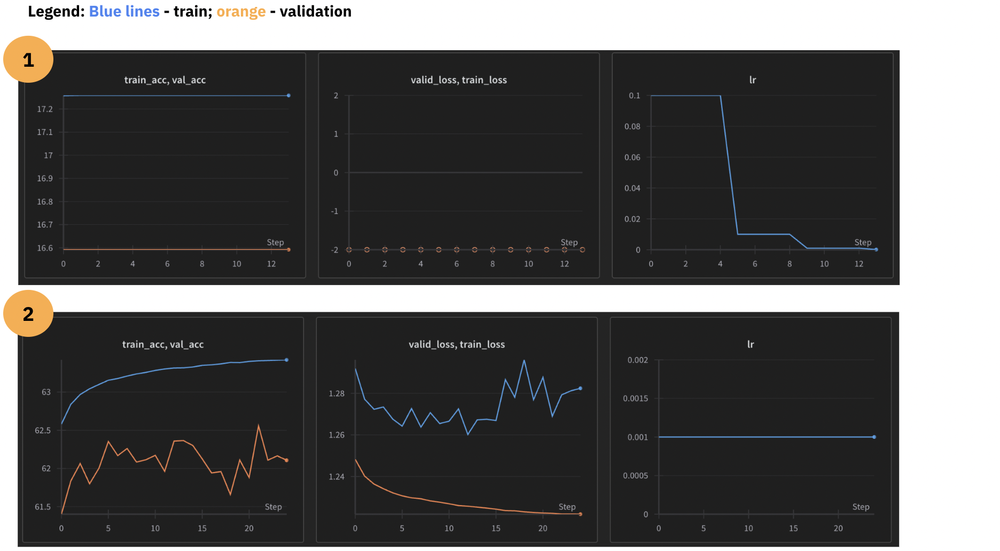

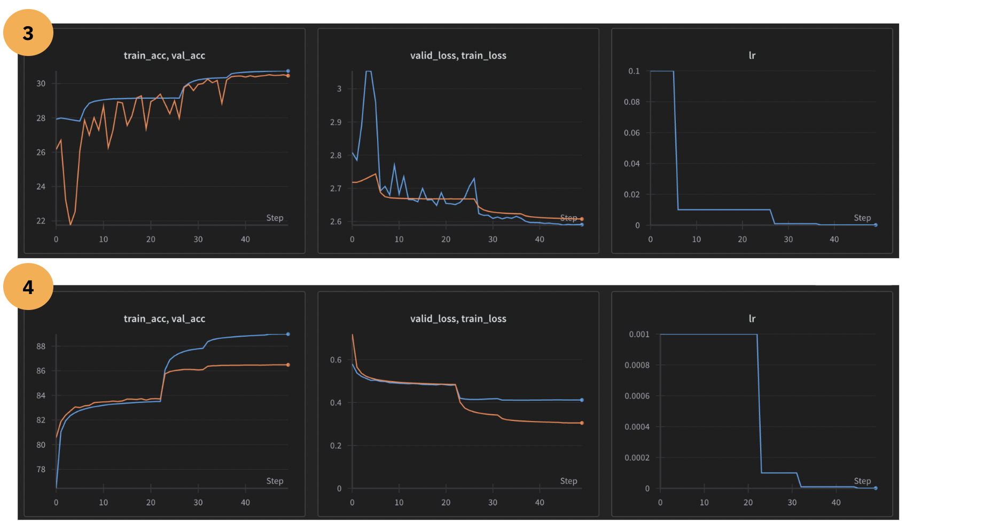

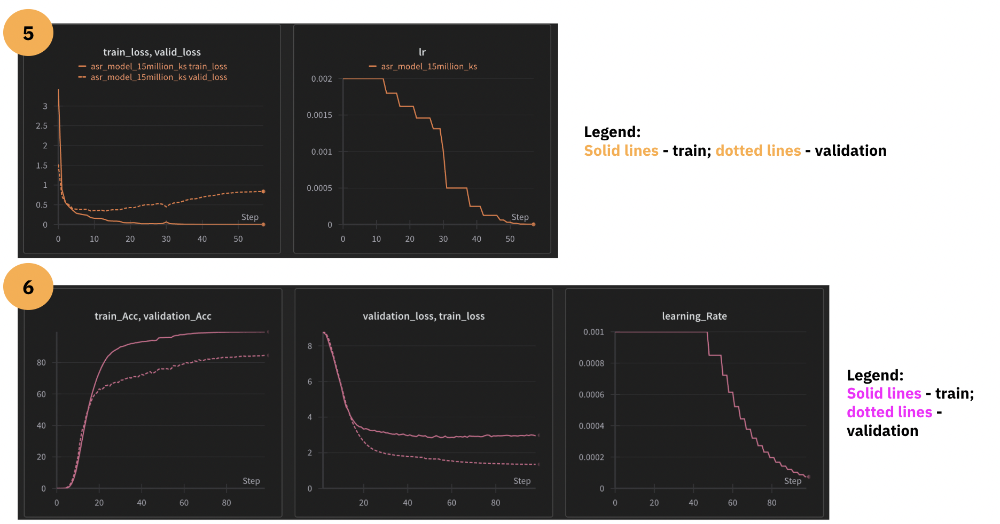

**CHECKPOINT #12**: Look at the Wandb (Weights & Biases) pictures above? For each model, tell should we stop training or not and why?

--- [Your answer] ---
- Model 1 -
- Model 2 -
- Model 3 -
- Model 4 -
- Model 5 -
- Model 6 -

### **2.4 Testing and submission to Kaggle**

**Tip**: make sure to check number of rows in the submission file. It should equal the length of the test dataset.

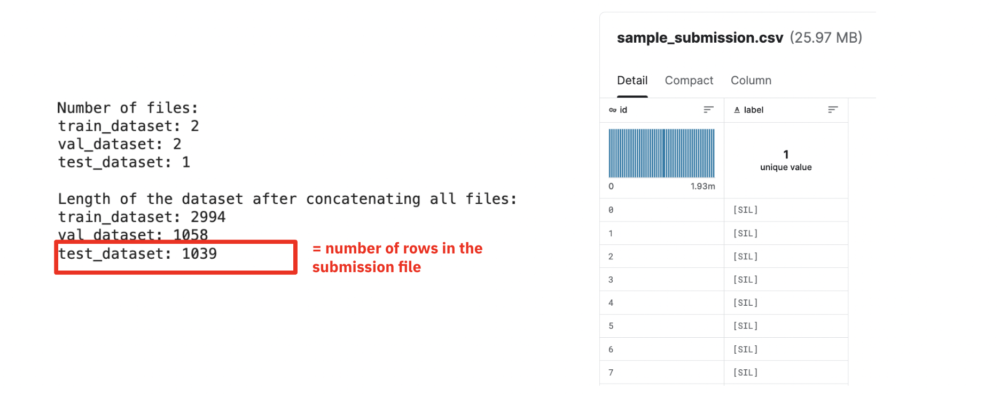



---



**--- End of the Lab 2 ---**

**Thank you!**